In [1]:
import ast
import json
import os
import shutil

import albumentations
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pydicom as dicom
import tensorflow as tf
from IPython.core.interactiveshell import InteractiveShell
from numba import cuda
from PIL import Image
from sklearn.model_selection import StratifiedKFold, train_test_split
from tensorflow import keras
from tqdm import tqdm

from src.augment import Aug, Aug_No_transform, Flip_Aug, Hard_Aug, Transform_Aug
from src.generator import Generator, GetModel

InteractiveShell.ast_node_interactivity = "all"

In [2]:
with open("/app/_data/base_config.json", "r") as f:
    base_config = json.load(f)
base_config["EFFB0"]["BATCH_SIZE"] = 100

# bounding boxes for lungs
1500 images are annotated

In [3]:
df1 = pd.read_csv("/app/_data/annot/train_annotations.csv")
df2 = pd.read_csv("/app/_data/annot/test_annotations.csv")
train_init = pd.read_csv("/app/_data/train.csv")
df = pd.concat([df1, df2], axis=0, ignore_index=True)
df["image"] = df["filename"].apply(lambda x: x.split("_")[0])
train_init["image"] = train_init["image"].str[:-4]
df.columns = [
    "filename",
    "width",
    "height",
    "class",
    "xmin_orig",
    "ymin_orig",
    "xmax_orig",
    "ymax_orig",
    "image",
]
df

,filename,width,height,class,xmin_orig,ymin_orig,xmax_orig,ymax_orig,image
0,aba3c1c137fb_jpg.rf.99f5dd184f01a5e565a88d9725...,2992,2991,opacity,538,550,2799,2505,aba3c1c137fb
1,f14c6029494a_jpg.rf.9abaf1c8601ac007ae947dc9ec...,2836,2336,opacity,843,0,2477,1405,f14c6029494a
2,779d18c490e9_jpg.rf.9a5e9e98ef52ab378a5d095562...,2836,2336,opacity,493,255,2392,2192,779d18c490e9
3,d01e8fd2c78d_jpg.rf.99ed26c2f18c9fe65f2296be87...,2836,2336,opacity,291,308,2425,1775,d01e8fd2c78d
4,5111066268f3_jpg.rf.9a8da54e154fe6948c0ce66821...,4256,3488,opacity,1151,7,4050,2267,5111066268f3
...,...,...,...,...,...,...,...,...,...
1499,9e987cbededa_jpg.rf.f7934f3b7b2c1169b19925e321...,4256,3488,opacity,778,457,3727,2397,9e987cbededa
1500,92cafb902940_jpg.rf.fdaabdb85002d5cbd8fb039949...,2880,2540,opacity,675,623,2589,2257,92cafb902940
1501,4d3e8ec75220_jpg.rf.f960e55da0616dcec97e93df6b...,3052,2948,opacity,781,800,2537,2445,4d3e8ec75220
1502,8fe0d7f14ab9_jpg.rf.ffdb67238cde5d5105a4721d09...,3032,2520,opacity,673,253,2762,2285,8fe0d7f14ab9


In [4]:
df[df['image'].duplicated(keep=False)]

,filename,width,height,class,xmin_orig,ymin_orig,xmax_orig,ymax_orig,image
199,4467cda706e7_jpg.rf.bcc618a00b241727b712eefc3d...,2836,2336,opacity,71,643,2297,1918,4467cda706e7
200,4467cda706e7_jpg.rf.bcc618a00b241727b712eefc3d...,2836,2336,opacity,2302,627,2303,640,4467cda706e7


In [5]:
df = df.query('index!=200')

In [6]:
df["xmin"] = df["xmin_orig"] / df["width"]
df["xmax"] = df["xmax_orig"] / df["width"]
df["ymin"] = df["ymin_orig"] / df["height"]
df["ymax"] = df["ymax_orig"] / df["height"]
df_train = df[["image", "xmin", "ymin", "xmax", "ymax", "width", "height"]]

<ipython-input-6-5bdc92feae5d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["xmin"] = df["xmin_orig"] / df["width"]
<ipython-input-6-5bdc92feae5d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["xmax"] = df["xmax_orig"] / df["width"]
<ipython-input-6-5bdc92feae5d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [7]:
df_train = df_train.merge(
    train_init[["image", "path", "class", "modality", "PhotometricInterpretation"]],
    on="image",
    how="left",
)
df_train

,image,xmin,ymin,xmax,ymax,width,height,path,class,modality,PhotometricInterpretation
0,aba3c1c137fb,0.179813,0.183885,0.935495,0.837513,2992,2991,/app/_data/train/f922ad35b0fc/c58941caced5/aba...,typical,CR,MONOCHROME2
1,f14c6029494a,0.297250,0.000000,0.873413,0.601455,2836,2336,/app/_data/train/c631e5f031a9/d5f43c97f5e9/f14...,typical,DX,MONOCHROME1
2,779d18c490e9,0.173836,0.109161,0.843441,0.938356,2836,2336,/app/_data/train/6e397c1d4ad8/312782992b90/779...,typical,CR,MONOCHROME1
3,d01e8fd2c78d,0.102609,0.131849,0.855078,0.759846,2836,2336,/app/_data/train/ba5b31cb8520/532c84b9c2d7/d01...,typical,CR,MONOCHROME1
4,5111066268f3,0.270442,0.002007,0.951598,0.649943,4256,3488,/app/_data/train/556b76b37e6e/8ffd5f01e609/511...,indeterminate,DX,MONOCHROME2
...,...,...,...,...,...,...,...,...,...,...,...
1498,9e987cbededa,0.182801,0.131021,0.875705,0.687213,4256,3488,/app/_data/train/fd62a2e871fb/3d38c025d8d5/9e9...,typical,DX,MONOCHROME2
1499,92cafb902940,0.234375,0.245276,0.898958,0.888583,2880,2540,/app/_data/train/86092024d731/5f453a0e36e1/92c...,indeterminate,DX,MONOCHROME2
1500,4d3e8ec75220,0.255898,0.271370,0.831258,0.829376,3052,2948,/app/_data/train/b6282272490f/f3dda00a1a43/4d3...,atypical,CR,MONOCHROME1
1501,8fe0d7f14ab9,0.221966,0.100397,0.910950,0.906746,3032,2520,/app/_data/train/73daf4596bf7/1a0a69e11348/8fe...,typical,CR,MONOCHROME2


In [8]:
train, val = train_test_split(df_train, train_size=1200)

# EfficientNetB0 for "xmin", "ymin", "xmax", "ymax"

In [9]:
mmod = Make_model(
    model_name="EFFB0",
    n_classes=4,
    lr=0.001,
    top_dropout_rate=None,
    activation_func="sigmoid",
    weights="imagenet",
    loss="bce",
    metrics=["mse", "mae"],
)

In [10]:
model = mmod.get_model()

In [11]:
gen_train = Gen(
    df=train,
    label_columns=["xmin", "ymin", "xmax", "ymax"],
    batch_size=base_config["EFFB0"]["BATCH_SIZE"],
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=True,
    augment_fn=Aug_No_transform,
    crop=False
)
gen_valid = Gen(
    df=val,
    label_columns=["xmin", "ymin", "xmax", "ymax"],
    batch_size=base_config["EFFB0"]["BATCH_SIZE"],
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=False,
    augment_fn=None,
    crop=False
)

In [13]:
callbacks = mmod.make_callback(
    model_path="/app/_data/models/crop/",
    model_name="EffB0_7.h5",
    tensorboard_path="/app/.tensorboard/EffB0_bbox77",
    patience_ES=12,
    patience_RLR=2,
    factor_LR=0.7,
    metric_for_monitor="val_loss",
    metric_mode="min",
)

Warning! Model path already exists.


In [14]:
history = model.fit(
    gen_train,
    validation_data=gen_valid,
    epochs=100,
    steps_per_epoch=len(train) // base_config["EFFB7"]["BATCH_SIZE"],
    validation_steps=len(val) // base_config["EFFB7"]["BATCH_SIZE"],
    verbose=1,
    workers=20,
    max_queue_size=500,
    callbacks=callbacks,
)

Epoch 1/100
300/300 [==============================] - 235s 730ms/step - loss: 0.4984 - mse: 0.0460 - mae: 0.1397 - val_loss: 0.3909 - val_mse: 0.0027 - val_mae: 0.0363

Epoch 00001: val_loss improved from inf to 0.39089, saving model to /app/_data/models/crop/EffB0_7.h5
Epoch 2/100
300/300 [==============================] - 218s 716ms/step - loss: 0.3800 - mse: 3.1433e-04 - mae: 0.0123 - val_loss: 0.3849 - val_mse: 0.0013 - val_mae: 0.0248

Epoch 00002: val_loss improved from 0.39089 to 0.38494, saving model to /app/_data/models/crop/EffB0_7.h5
Epoch 3/100
300/300 [==============================] - 219s 717ms/step - loss: 0.3801 - mse: 3.6244e-04 - mae: 0.0111 - val_loss: 0.4598 - val_mse: 0.0036 - val_mae: 0.0399

Epoch 00003: val_loss did not improve from 0.38494
Epoch 4/100
300/300 [==============================] - 216s 709ms/step - loss: 0.3819 - mse: 6.4734e-04 - mae: 0.0164 - val_loss: 0.3834 - val_mse: 8.8917e-04 - val_mae: 0.0194

Epoch 00004: val_loss improved from 0.38494 t

# plots

In [17]:
model1 = keras.models.load_model("/app/_data/models/crop/EffB0_5.h5")
model2 = keras.models.load_model("/app/_data/models/crop/EffB0_3.h5")  # best
model3 = keras.models.load_model("/app/_data/models/crop/EffB0_37_1.h5")

## validation images

In [61]:
sample_df = val.sample(40).reset_index(drop=True)
gen_valid = Gen(
    df=sample_df,
    label_columns=["xmin", "ymin", "xmax", "ymax"],
    batch_size=1,
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=False,
    augment_fn=None,
)

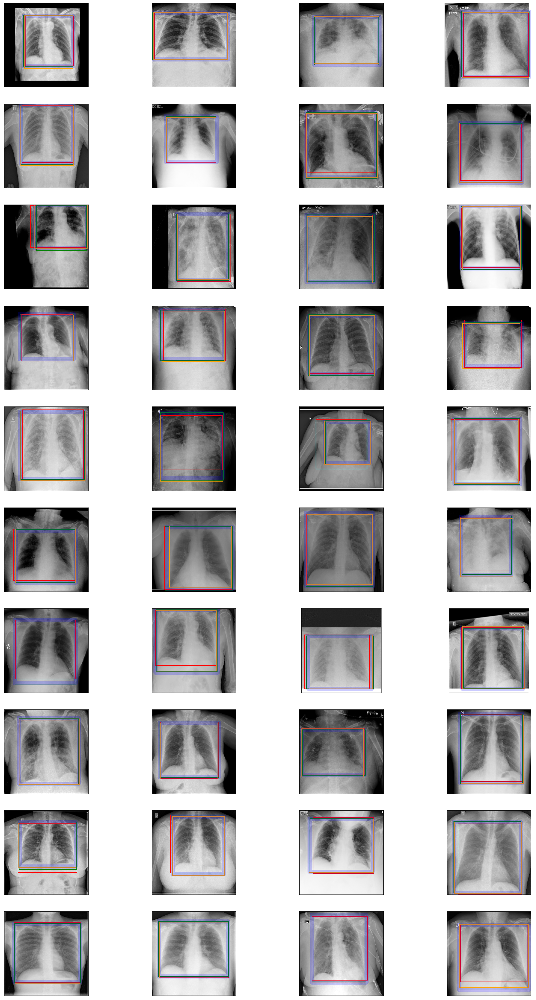

In [62]:
plt.figure(figsize=(25, 45))
for i in range(40):
    img, coord = gen_valid.__getitem__(i)
    pred1 = model1.predict(img)[0]
    pred2 = model2.predict(img)[0]
    pred3 = model3.predict(img)[0]
    plt.subplot(10, 4, i + 1)
    x_min = coord[0][0] * 224
    y_min = coord[0][1] * 224
    x_max = coord[0][2] * 224
    y_max = coord[0][3] * 224
    x_min1 = pred1[0] * 224
    y_min1 = pred1[1] * 224
    x_max1 = pred1[2] * 224
    y_max1 = pred1[3] * 224

    x_min2 = pred2[0] * 224
    y_min2 = pred2[1] * 224
    x_max2 = pred2[2] * 224
    y_max2 = pred2[3] * 224

    x_min3 = pred3[0] * 224
    y_min3 = pred3[1] * 224
    x_max3 = pred3[2] * 224
    y_max3 = pred3[3] * 224
    plt.imshow(img[0])
    plt.plot(
        [x_min1, x_max1, x_max1, x_min1, x_min1],
        [y_min1, y_min1, y_max1, y_max1, y_min1],
        color="r",
    )
    plt.plot(
        [x_min2, x_max2, x_max2, x_min2, x_min2],
        [y_min2, y_min2, y_max2, y_max2, y_min2],
        color="g",
    )
    plt.plot(
        [x_min3, x_max3, x_max3, x_min3, x_min3],
        [y_min3, y_min3, y_max3, y_max3, y_min3],
        color="orange",
    )
    plt.plot(
        [x_min, x_max, x_max, x_min, x_min],
        [y_min, y_min, y_max, y_max, y_min],
        color="blue",
        alpha=0.2,
        linewidth=10,
    )
    plt.xticks([])
    plt.yticks([])

plt.show();

## all images

In [63]:
sample_train = train_init.sample(40).reset_index(drop=True)
gen_valid = Gen(
    df=sample_train,
    label_columns=[
        "Negative for Pneumonia",
        "Typical Appearance",
        "Indeterminate Appearance",
        "Atypical Appearance",
    ],
    batch_size=1,
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=False,
    augment_fn=None,
)

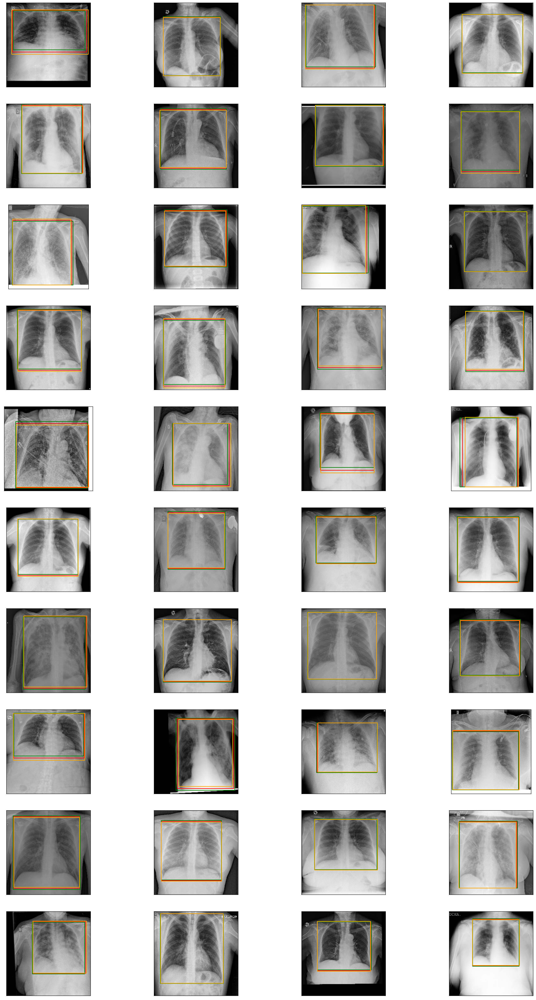

In [64]:
plt.figure(figsize=(25, 45))
for i in range(40):
    img, coord = gen_valid.__getitem__(i)
    pred2 = model2.predict(img)[0]
    pred3 = model3.predict(img)[0]
    plt.subplot(10, 4, i + 1)

    x_min2 = pred2[0] * 224
    y_min2 = pred2[1] * 224
    x_max2 = pred2[2] * 224
    y_max2 = pred2[3] * 224

    x_min3 = pred3[0] * 224
    y_min3 = pred3[1] * 224
    x_max3 = pred3[2] * 224
    y_max3 = pred3[3] * 224

    x_min1 = (x_min2 + x_min3) / 2
    y_min1 = (y_min2 + y_min3) / 2
    x_max1 = (x_max2 + x_max3) / 2
    y_max1 = (y_max2 + y_max3) / 2
    plt.imshow(img[0])
    plt.plot(
        [x_min1, x_max1, x_max1, x_min1, x_min1],
        [y_min1, y_min1, y_max1, y_max1, y_min1],
        color="r",
    )
    plt.plot(
        [x_min2, x_max2, x_max2, x_min2, x_min2],
        [y_min2, y_min2, y_max2, y_max2, y_min2],
        color="g",
    )
    plt.plot(
        [x_min3, x_max3, x_max3, x_min3, x_min3],
        [y_min3, y_min3, y_max3, y_max3, y_min3],
        color="orange",
    )
    plt.xticks([])
    plt.yticks([])

plt.show();

## predictions

In [6]:
model = keras.models.load_model("/app/_data/models/crop/EffB0_3.h5")  # best

In [16]:
train_init = train_init.merge(
    df_train[["image", "xmin", "ymin", "xmax", "ymax"]], on="image", how="left"
)
df_pred = train_init[train_init["xmin"].isna()].reset_index(drop=True)
df_annot = train_init[train_init["xmin"].notna()].reset_index(drop=True)

In [17]:
gen = Gen(
    df=df_pred,
    label_columns=[
        "Negative for Pneumonia",
        "Typical Appearance",
        "Indeterminate Appearance",
        "Atypical Appearance",
    ],
    batch_size=1,
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=False,
    augment_fn=None,
)

In [18]:
for ix in tqdm(df_pred.index.tolist()):
    img, coord = gen.__getitem__(ix)
    pred = model.predict(img)[0]
    df_pred.loc[ix, "xmin"] = pred[0]
    df_pred.loc[ix, "ymin"] = pred[1]
    df_pred.loc[ix, "xmax"] = pred[2]
    df_pred.loc[ix, "ymax"] = pred[3]

100%|██████████| 4831/4831 [17:43<00:00,  4.54it/s]


# plot

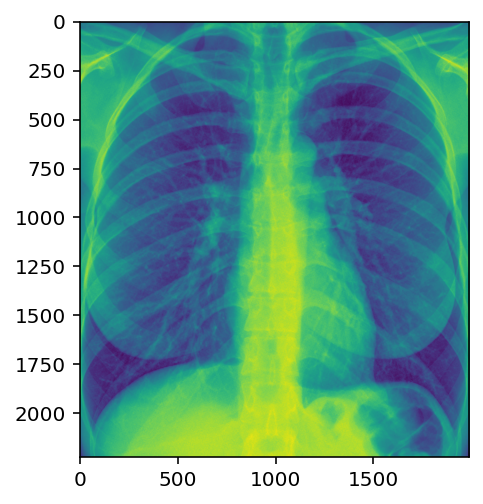

In [48]:
ix = 1555
data_file = dicom.dcmread(df_pred.loc[ix, "path"])
coord = df_pred.loc[ix, ["xmin", "ymin", "xmax", "ymax"]].values
img = data_file.pixel_array
if df_pred.loc[ix, "PhotometricInterpretation"] == "MONOCHROME1":
    img = img.max() - img
img = (img - img.min()) / (img.max() - img.min())
img = (np.array(img) * 255).astype("uint8")
xmin = coord[0] * img.shape[1]
ymin = coord[1] * img.shape[0]
xmax = coord[2] * img.shape[1]
ymax = coord[3] * img.shape[0]
img = img[int(ymin) : int(ymax), int(xmin) : int(xmax)]
plt.imshow(img)

In [73]:
df = pd.concat([df_pred, df_annot], axis=0, ignore_index=True)

In [75]:
df["crop_w"] = (df["xmax"] - df["xmin"]) * df["width"]
df["crop_h"] = (df["ymax"] - df["ymin"]) * df["height"]

In [77]:
df[df["ymax"] - df["ymin"]==(df["ymax"] - df["ymin"]).min()]

,id_image,boxes,label,StudyInstanceUID,image,id_study,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,...,n_bbox,modality_id,p_sex,body_part_id,xmin,ymin,xmax,ymax,crop_w,crop_h
5214,4467cda706e7_image,"[{'x': 78.85892, 'y': 810.21421, 'width': 788....",opacity 1 78.85892 810.21421 867.44799 1733.15...,394a6b02efc9,4467cda706e7,394a6b02efc9_study,0,1,0,0,...,2,1,1,2,0.811707,0.268408,0.812059,0.273973,1.0,13.0


In [80]:
df.to_csv('/app/_data/predicted_crop_v1.csv', index=False)

In [16]:
df = pd.read_csv('/app/_data/predicted_crop_v1.csv')

In [17]:
df["crop_w"].min()
df["crop_h"].describe()

695.6776911020279

count    6334.000000
mean     1961.250631
std       461.209195
min       523.522070
25%      1665.556959
50%      1930.785991
75%      2225.412279
max      3573.552578
Name: crop_h, dtype: float64

(array([  81.,  127.,  440., 1362., 1909., 1233.,  637.,  407.,  124.,
          14.]),
 array([ 523.5220702 ,  828.52512093, 1133.52817166, 1438.53122239,
        1743.53427313, 2048.53732386, 2353.54037459, 2658.54342532,
        2963.54647605, 3268.54952678, 3573.55257751]),
 <BarContainer object of 10 artists>)

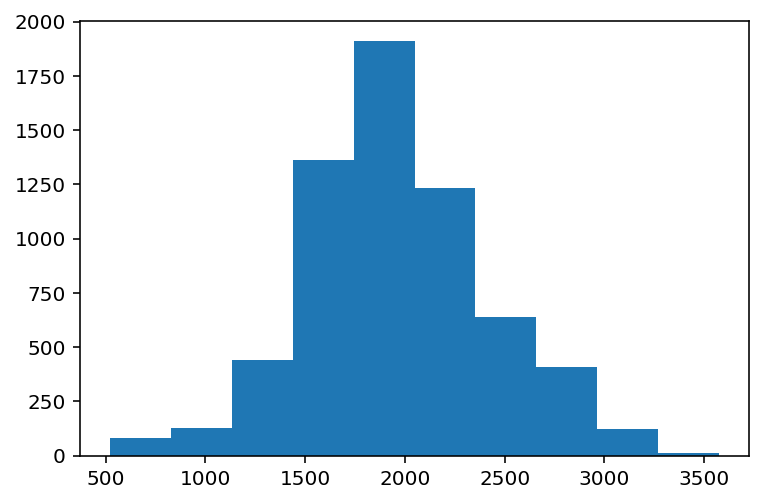

In [19]:
plt.hist(df["crop_h"])

(array([ 102.,  102.,  364., 1735., 1990.,  866.,  633.,  450.,   82.,
          10.]),
 array([ 695.6776911 , 1046.90284967, 1398.12800824, 1749.35316681,
        2100.57832537, 2451.80348394, 2803.02864251, 3154.25380108,
        3505.47895964, 3856.70411821, 4207.92927678]),
 <BarContainer object of 10 artists>)

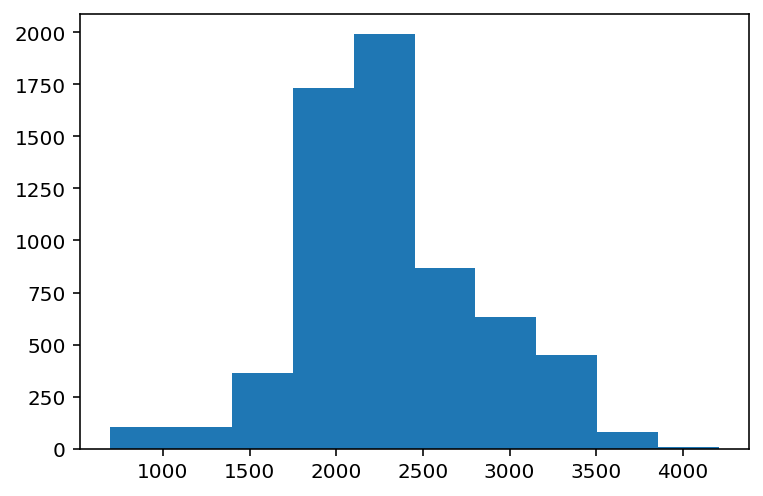

In [20]:
plt.hist(df["crop_w"])

# Additional data

In [2]:
model = keras.models.load_model("/app/_data/models/crop/EffB0_3.h5")  # best

In [3]:
labels = pd.read_csv("/app/_data/additional_dataset/labels_full.csv")
labels

,patientId,x,y,width,height,Target,modality,PatientSex,BodyPartExamined,PhotometricInterpretation,img_height,img_width,x_center,y_center,w,h,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,0.361816,0.333496,0.208008,0.370117,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,0.291992,0.476074,0.222656,0.370117,0
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,0.684082,0.552246,0.254883,0.336914,0


In [8]:
labels['image']= labels['patientId']
labels['path'] = '/app/_data/additional_dataset/stage_2_train_images/'+labels['patientId']+'.dcm'
labels

,patientId,x,y,width,height,Target,modality,PatientSex,BodyPartExamined,PhotometricInterpretation,img_height,img_width,x_center,y_center,w,h,class,image,path
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,/app/_data/additional_dataset/stage_2_train_im...
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,/app/_data/additional_dataset/stage_2_train_im...
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,00322d4d-1c29-4943-afc9-b6754be640eb,/app/_data/additional_dataset/stage_2_train_im...
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,/app/_data/additional_dataset/stage_2_train_im...
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,0.361816,0.333496,0.208008,0.370117,0,00436515-870c-4b36-a041-de91049b9ab4,/app/_data/additional_dataset/stage_2_train_im...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,0.291992,0.476074,0.222656,0.370117,0,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,/app/_data/additional_dataset/stage_2_train_im...
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,c1edf42b-5958-47ff-a1e7-4f23d99583ba,/app/_data/additional_dataset/stage_2_train_im...
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,1024.0,1024.0,NaN,NaN,NaN,NaN,0,c1f6b555-2eb1-4231-98f6-50a963976431,/app/_data/additional_dataset/stage_2_train_im...
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,CR,F,CHEST,MONOCHROME2,1024.0,1024.0,0.684082,0.552246,0.254883,0.336914,0,c1f7889a-9ea9-4acb-b64c-b737c929599a,/app/_data/additional_dataset/stage_2_train_im...


In [9]:
gen = Generator(
    df=labels,
    label_columns= None,
    batch_size=1,
    img_size=base_config["EFFB0"]["IMG_SIZE"],
    seed=base_config["EFFB0"]["SEED"],
    cache_img_path="/app/_data/npy_224/",
    shuffle=False,
    augment_fn=None,
)


In [11]:
for ix in tqdm(labels.index.tolist()):
    img, coord = gen.__getitem__(ix)
    pred = model.predict(img)[0]
    labels.loc[ix, "xmin"] = pred[0]
    labels.loc[ix, "ymin"] = pred[1]
    labels.loc[ix, "xmax"] = pred[2]
    labels.loc[ix, "ymax"] = pred[3]

100%|██████████| 30227/30227 [38:57<00:00, 12.93it/s]


In [12]:
labels

,patientId,x,y,width,height,Target,modality,PatientSex,BodyPartExamined,PhotometricInterpretation,...,y_center,w,h,class,image,path,xmin,ymin,xmax,ymax
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,/app/_data/additional_dataset/stage_2_train_im...,0.231538,0.152784,0.868654,0.751009
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,/app/_data/additional_dataset/stage_2_train_im...,0.063302,0.235900,0.883660,0.761328
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,00322d4d-1c29-4943-afc9-b6754be640eb,/app/_data/additional_dataset/stage_2_train_im...,0.114486,0.041784,0.890716,0.724560
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,/app/_data/additional_dataset/stage_2_train_im...,0.125391,0.111954,0.875462,0.863721
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,CR,F,CHEST,MONOCHROME2,...,0.333496,0.208008,0.370117,0,00436515-870c-4b36-a041-de91049b9ab4,/app/_data/additional_dataset/stage_2_train_im...,0.185933,0.134582,0.805438,0.672207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,CR,M,CHEST,MONOCHROME2,...,0.476074,0.222656,0.370117,0,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,/app/_data/additional_dataset/stage_2_train_im...,0.136216,0.093138,0.869451,0.787371
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,CR,F,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,c1edf42b-5958-47ff-a1e7-4f23d99583ba,/app/_data/additional_dataset/stage_2_train_im...,0.172609,0.197233,0.895536,0.821171
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,CR,M,CHEST,MONOCHROME2,...,NaN,NaN,NaN,0,c1f6b555-2eb1-4231-98f6-50a963976431,/app/_data/additional_dataset/stage_2_train_im...,0.082085,0.100155,0.878707,0.936668
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,CR,F,CHEST,MONOCHROME2,...,0.552246,0.254883,0.336914,0,c1f7889a-9ea9-4acb-b64c-b737c929599a,/app/_data/additional_dataset/stage_2_train_im...,0.183922,0.191654,0.875833,0.825657


In [13]:
labels.to_csv("/app/_data/additional_dataset/labels_full.csv", index=False)

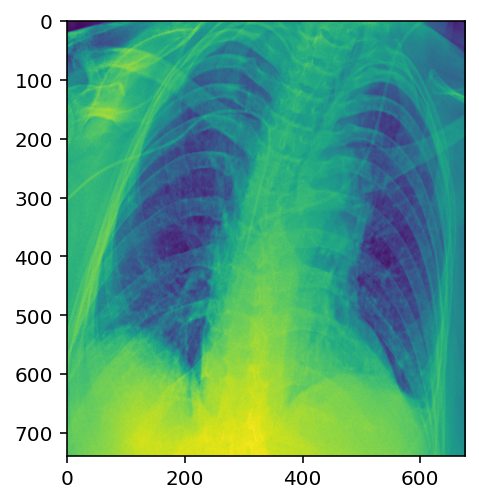

In [16]:
ix = 667
data_file = dicom.dcmread(labels.loc[ix, "path"])
coord = labels.loc[ix, ["xmin", "ymin", "xmax", "ymax"]].values
img = data_file.pixel_array
if labels.loc[ix, "PhotometricInterpretation"] == "MONOCHROME1":
    img = img.max() - img
img = (img - img.min()) / (img.max() - img.min())
img = (np.array(img) * 255).astype("uint8")
xmin = coord[0] * img.shape[1]
ymin = coord[1] * img.shape[0]
xmax = coord[2] * img.shape[1]
ymax = coord[3] * img.shape[0]
img = img[int(ymin) : int(ymax), int(xmin) : int(xmax)]
plt.imshow(img)